## importing libraries

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
sns.set()
import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)

In [2]:
df=pd.read_csv('day.csv')
df.head()

,instant,dteday,season,yr,mnth,holiday,weekday,workingday,weathersit,temp,atemp,hum,windspeed,casual,registered,cnt
0,1,2011-01-01,1,0,1,0,6,0,2,0.344167,0.363625,0.805833,0.160446,331,654,985
1,2,2011-01-02,1,0,1,0,0,0,2,0.363478,0.353739,0.696087,0.248539,131,670,801
2,3,2011-01-03,1,0,1,0,1,1,1,0.196364,0.189405,0.437273,0.248309,120,1229,1349
3,4,2011-01-04,1,0,1,0,2,1,1,0.200000,0.212122,0.590435,0.160296,108,1454,1562
4,5,2011-01-05,1,0,1,0,3,1,1,0.226957,0.229270,0.436957,0.186900,82,1518,1600


In [3]:
import pandas_profiling

In [4]:
df.profile_report()

### we got some wonderful details

#### 1. temp is highly correlated with atemp
#### 2. registered is highly correlated with cnt
#### 3. all 4 seasons are almost uniormly distributed
#### 4. 710 days were not holidays and 21 days were holiday
#### 5. among all the data, 500 days were working days and 231 days were non working days
#### 6. casual users count distribution is right skewed that means less amount of casual users took more bike on rental
#### 7. registered users count distribution is almost normally distributed
#### 8. bike rental count is also almost normally distributed

### EDA

In [5]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
instant,731.0,366.000000,211.165812,1.000000,183.500000,366.000000,548.500000,731.000000
season,731.0,2.496580,1.110807,1.000000,2.000000,3.000000,3.000000,4.000000
yr,731.0,0.500684,0.500342,0.000000,0.000000,1.000000,1.000000,1.000000
mnth,731.0,6.519836,3.451913,1.000000,4.000000,7.000000,10.000000,12.000000
holiday,731.0,0.028728,0.167155,0.000000,0.000000,0.000000,0.000000,1.000000
weekday,731.0,2.997264,2.004787,0.000000,1.000000,3.000000,5.000000,6.000000
workingday,731.0,0.683995,0.465233,0.000000,0.000000,1.000000,1.000000,1.000000
weathersit,731.0,1.395349,0.544894,1.000000,1.000000,1.000000,2.000000,3.000000
temp,731.0,0.495385,0.183051,0.059130,0.337083,0.498333,0.655417,0.861667
atemp,731.0,0.474354,0.162961,0.079070,0.337842,0.486733,0.608602,0.840896


In [5]:
df2=df.copy(deep=True)

In [9]:
df2.dteday=pd.to_datetime(df2.dteday)

In [10]:
df2.set_index('dteday',inplace=True)

<AxesSubplot:xlabel='dteday'>

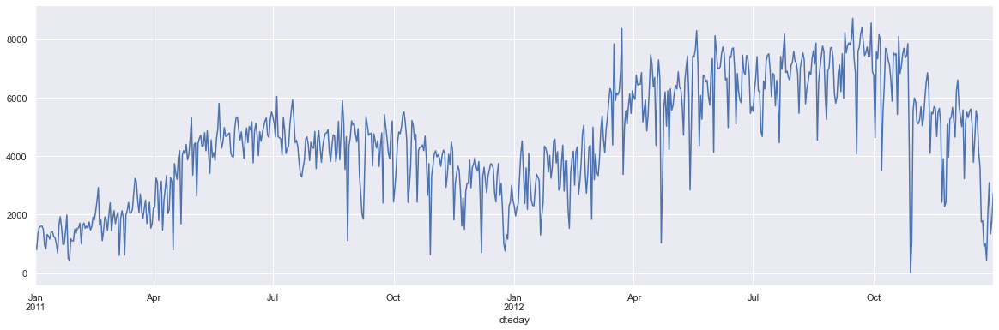

In [13]:
plt.figure(figsize=(20,6))
df2['cnt'].plot()

In [14]:
# these shows that bike rantal count has seasonality and quite upwards trend.

<AxesSubplot:xlabel='season'>

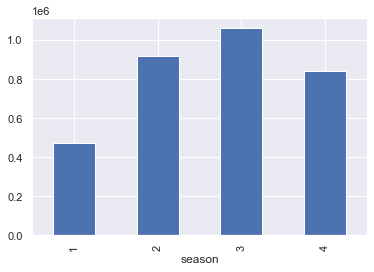

In [11]:
df.groupby('season')['cnt'].sum().plot(kind='bar')

In [12]:
# maximum bike rent was in season 3.

<AxesSubplot:xlabel='mnth'>

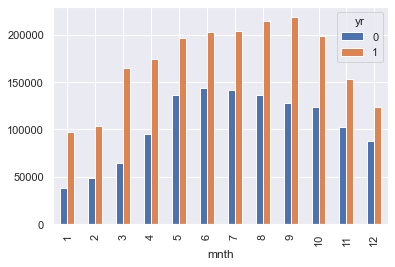

In [24]:
df.groupby(['mnth','yr'])['cnt'].sum().unstack().plot(kind='bar')

In [25]:
# this plot shows the total bike rental count of every month of 2011 and 2012
# from MAY to OCTOBER the total bike rental count was high in every year and total rental in every month has increased from 2011 to 2012

<AxesSubplot:xlabel='weekday'>

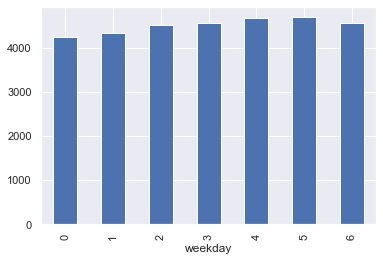

In [21]:
df.groupby(['weekday'])['cnt'].mean().plot(kind='bar')

In [22]:
# this plot shows that the average bike rental count on a week. there is no significant difference we have found.

In [29]:
df.groupby('weathersit')['cnt'].sum()

weathersit
1    2257952
2     996858
3      37869
Name: cnt, dtype: int64

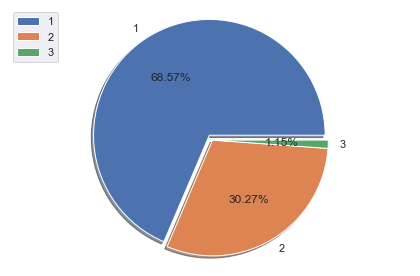

In [30]:
plt.pie(df.groupby('weathersit')['cnt'].sum(),labels=['1','2','3'],explode=(0.05,0,0),radius=1,autopct='%0.2f%%',shadow=True)
plt.tight_layout()
plt.legend(loc='upper left')
plt.axis('equal')
plt.show()

In [31]:
# we have found total out of total bike rental count, 68.57% count was in "Clear, Few clouds, Partly cloudy, Partly cloudy" weather
# and 30.27% was in " Mist + Cloudy, Mist + Broken clouds, Mist + Few clouds, Mist" weather.

<AxesSubplot:xlabel='temp', ylabel='cnt'>

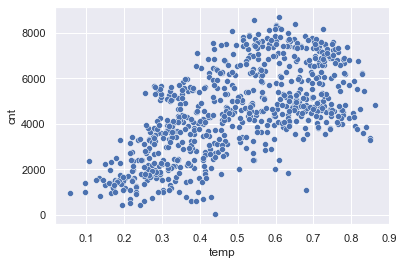

In [33]:
sns.scatterplot(x='temp',y='cnt',data=df)

In [34]:
# we found almost linear relation between temp and count

<AxesSubplot:xlabel='windspeed', ylabel='cnt'>

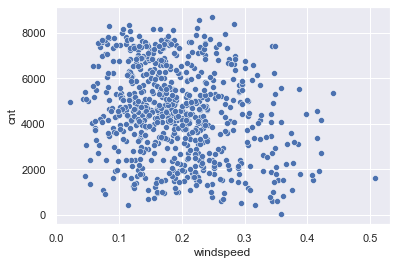

In [36]:
sns.scatterplot(x='windspeed',y='cnt',data=df)

In [38]:
# not much interpritation from the above plot

<AxesSubplot:xlabel='season', ylabel='cnt'>

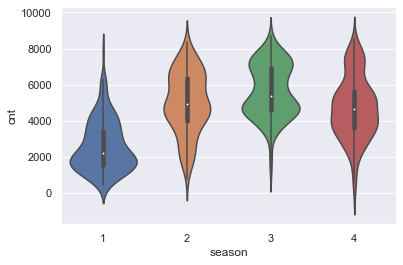

In [39]:
sns.violinplot(x=df.season,y=df.cnt)

In [40]:
# less count was in season 1 and it is right skewed
# rest 3 seasons has not exactly any long tail and more or less season 2,3,4 have similar distribution

In [49]:
cat_var=['season','holiday','weekday','workingday','weathersit','yr','mnth']
df[cat_var]=df[cat_var].apply(lambda x: x.astype('category') )
num_var=['temp','atemp','hum','windspeed','casual','registered']

## outlier analysis

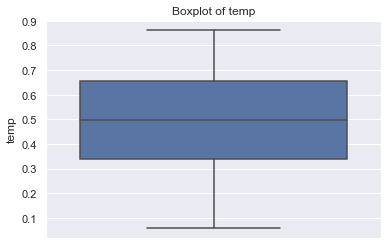

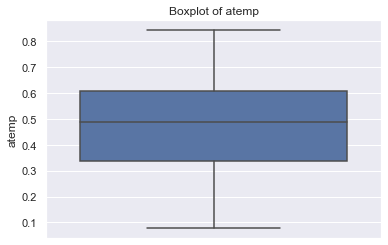

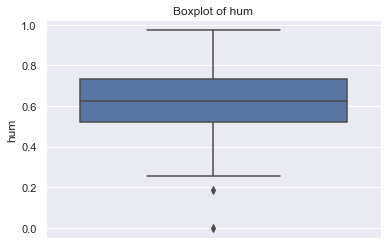

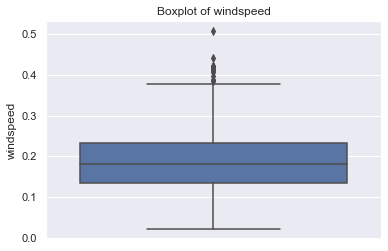

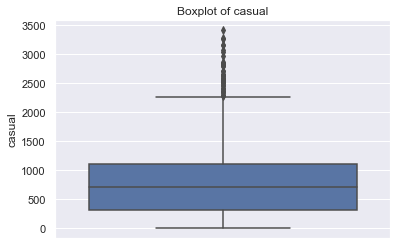

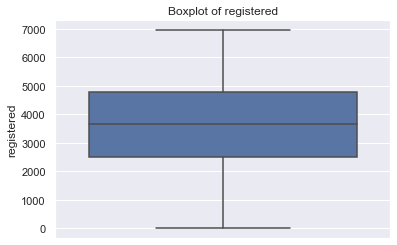

In [50]:
for i in num_var:
    sns.boxplot(y=i,data=df)
    plt.title('Boxplot of '+i)
    plt.show()

In [51]:
# we have found some outliers on the features - casual, windspeed and humidity

In [3]:
Q1=df.quantile(0.25)
Q3=df.quantile(0.75)
IQR=Q3-Q1
IQR

instant        365.000000
season           1.000000
yr               1.000000
mnth             6.000000
holiday          0.000000
weekday          4.000000
workingday       1.000000
weathersit       1.000000
temp             0.318333
atemp            0.270760
hum              0.210209
windspeed        0.098265
casual         780.500000
registered    2279.500000
cnt           2804.000000
dtype: float64

In [4]:
df[['casual','windspeed','hum']]=df[['casual','windspeed','hum']][~((df[['casual','windspeed','hum']] < (Q1 - 1.5*IQR))| (df[['casual','windspeed','hum']]> (Q3 + 1.5*IQR))).any(axis=1)]

In [5]:
df.isnull().sum()

instant        0
dteday         0
season         0
yr             0
mnth           0
holiday        0
weekday        0
workingday     0
weathersit     0
temp           0
atemp          0
hum           58
windspeed     58
casual        58
registered     0
cnt            0
dtype: int64

In [6]:
from sklearn.impute import KNNImputer
knn=KNNImputer()

In [7]:
df[['temp','atemp','hum','windspeed','casual','registered','cnt']]=knn.fit_transform(df[['temp','atemp','hum','windspeed','casual','registered','cnt']])

### feature selection

<AxesSubplot:>

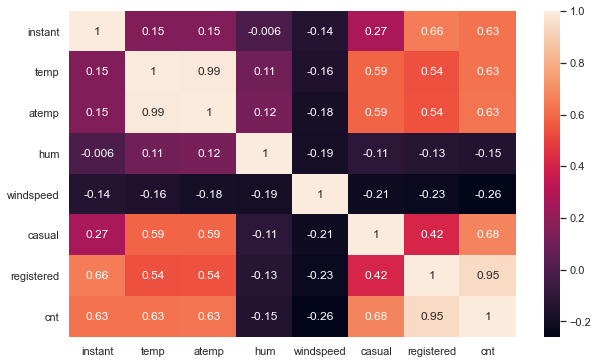

In [61]:
plt.figure(figsize=(10,6))
sns.heatmap(df.corr(),annot=True)

In [62]:
# there are some multicolliearity are there. that we will remove using PCA.

In [9]:
x=df.drop(['cnt','instant','dteday'],axis=1)
y=df['cnt']

In [72]:
x

,season,yr,mnth,holiday,weekday,workingday,weathersit,temp,atemp,hum,windspeed,casual,registered
0,1,0,1,0,6,0,2,0.344167,0.363625,0.805833,0.160446,331.0,654.0
1,1,0,1,0,0,0,2,0.363478,0.353739,0.696087,0.248539,131.0,670.0
2,1,0,1,0,1,1,1,0.196364,0.189405,0.437273,0.248309,120.0,1229.0
3,1,0,1,0,2,1,1,0.200000,0.212122,0.590435,0.160296,108.0,1454.0
4,1,0,1,0,3,1,1,0.226957,0.229270,0.436957,0.186900,82.0,1518.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
726,1,1,12,0,4,1,2,0.254167,0.226642,0.652917,0.350133,247.0,1867.0
727,1,1,12,0,5,1,2,0.253333,0.255046,0.590000,0.155471,644.0,2451.0
728,1,1,12,0,6,0,2,0.253333,0.242400,0.752917,0.124383,159.0,1182.0
729,1,1,12,0,0,0,1,0.255833,0.231700,0.483333,0.350754,364.0,1432.0


In [8]:
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import OneHotEncoder

In [10]:
columntranform=ColumnTransformer([('encoder',OneHotEncoder(),[0,1,2,3,4,5,6])],remainder='passthrough')
x=columntranform.fit_transform(x)

In [11]:
from sklearn.preprocessing import StandardScaler
sc=StandardScaler()
x=sc.fit_transform(x)

In [12]:
from sklearn.decomposition import PCA
pca=PCA()
x=pca.fit_transform(x)

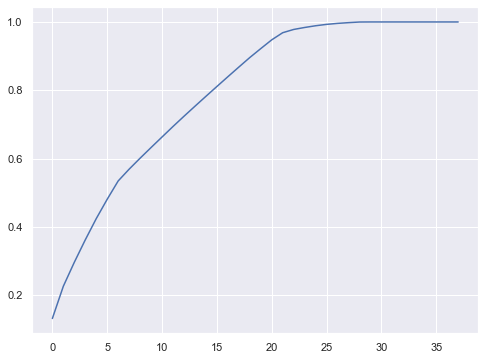

In [13]:
plt.figure(figsize=(8,6))
plt.plot(np.cumsum(pca.explained_variance_ratio_))
plt.show()

In [85]:
# we found first 26 principle components are expalin almost 100% variances, so we will take first 26 principle components

In [14]:
pca=PCA(n_components=26)
new_data=pca.fit_transform(x)

In [15]:
from sklearn.model_selection import train_test_split
x_train,x_test,y_train,y_test=train_test_split(new_data,y,test_size=0.2)

### building models 

In [90]:
# Regression metrics for our Models:

# R squared
# adjusted R squared 
# MAE
# MSE
# RMSE

In [16]:
from sklearn.linear_model import LinearRegression,Ridge,Lasso
from sklearn.model_selection import TimeSeriesSplit
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import cross_val_score
from sklearn.ensemble import RandomForestRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn import metrics

In [17]:
def scores(y, y_):
    print('r square  ', metrics.r2_score(y, y_))
    print('Adjusted r square:{}'.format(1 - (1-metrics.r2_score(y, y_))*(len(y)-1)/(len(y)-x_train.shape[1]-1)))
    print('MSE:', metrics.mean_squared_error(y, y_))
    print('RMSE:', np.sqrt(metrics.mean_squared_error(y, y_))) 
def test_scores(model):
    print('Training Data Score :')
    y_pred = model.predict(x_train)
    scores(y_train,y_pred)
    print('\n')
    print('Test Data Score :')
    y_pred = model.predict(x_test)
    scores(y_test,y_pred)

In [96]:
grid_param={
    'n_estimators':[80,100,120],
    'max_depth' : [2,3,4],
    'min_samples_split': [4,5,6]
}
grid_search=GridSearchCV(RandomForestRegressor(n_jobs=-1),param_grid=grid_param,cv=5)
grid_search.fit(x_train,y_train)

GridSearchCV(cv=5, estimator=RandomForestRegressor(n_jobs=-1),
             param_grid={'max_depth': [2, 3, 4], 'min_samples_split': [4, 5, 6],
                         'n_estimators': [80, 100, 120]})

In [97]:
grid_search.best_estimator_

RandomForestRegressor(max_depth=4, min_samples_split=5, n_estimators=80,
                      n_jobs=-1)

In [108]:
forest=RandomForestRegressor(n_estimators=80,max_depth=4,min_impurity_split=5)
forest.fit(x_train,y_train)
pred=forest.predict(x_test)
test_scores(forest)

Training Data Score :
r square   0.9238005376459918
Adjusted r square:0.9202436507138478
MSE: 285398.9232416345
RMSE: 534.2274077971239


Test Data Score :
r square   0.8917343463076969
Adjusted r square:0.8682767880076978
MSE: 405791.1649863356
RMSE: 637.0173977108755


In [18]:
from xgboost import XGBRegressor
xgb=XGBRegressor()

In [19]:
params={
    'max_depth':[4,5,6],
    'learning_rate':[0.1,0.01,0.001,0.0001],
    'n_estimators':[80,100,120]
}
grid_search=GridSearchCV(XGBRegressor(),param_grid=params,cv=5)
grid_search.fit(x_train,y_train)

GridSearchCV(cv=5,
             estimator=XGBRegressor(base_score=None, booster=None,
                                    colsample_bylevel=None,
                                    colsample_bynode=None,
                                    colsample_bytree=None, gamma=None,
                                    gpu_id=None, importance_type='gain',
                                    interaction_constraints=None,
                                    learning_rate=None, max_delta_step=None,
                                    max_depth=None, min_child_weight=None,
                                    missing=nan, monotone_constraints=None,
                                    n_estimators=100, n_jobs=None,
                                    num_parallel_tree=None, random_state=None,
                                    reg_alpha=None, reg_lambda=None,
                                    scale_pos_weight=None, subsample=None,
                                    tree_method=None, validate_para

In [20]:
grid_search.best_params_

{'learning_rate': 0.1, 'max_depth': 4, 'n_estimators': 120}

In [21]:
xgb=XGBRegressor(learning_rate=0.1,max_depth=4,n_estimators=120)
xgb.fit(x_train,y_train)
xgb.predict(x_test)
test_scores(xgb)

Training Data Score :
r square   0.9973579022190968
Adjusted r square:0.997234572699701
MSE: 9537.467198501494
RMSE: 97.65995698596991


Test Data Score :
r square   0.9532189868893651
Adjusted r square:0.9430831007153943
MSE: 198144.739920976
RMSE: 445.1345189052136


In [115]:
# XGB is giving least RMSE as well as it is giving a good adjusted R squared value.
# so, after seeing all the two models results, we decided to choose XGB model for the best model with this dataset for prediction.

In [29]:
# making prediction

In [23]:
pred=xgb.predict(x_test)

In [32]:
compare=pd.DataFrame(y_test)

In [37]:
compare.reset_index(drop=True,inplace=True)

In [38]:
compare['prediction']=pred

In [44]:
compare.head(10)

,cnt,prediction
0,4665.0,4713.277344
1,4677.0,4667.178711
2,5611.0,5672.184082
3,1472.0,1458.909180
4,6639.0,7160.737793
5,7415.0,7077.289062
6,1421.0,1457.416870
7,6436.0,6662.099121
8,2633.0,2751.273438
9,3926.0,3882.063965


In [45]:
# the dataframe shows the original count and predicted count.

<AxesSubplot:>

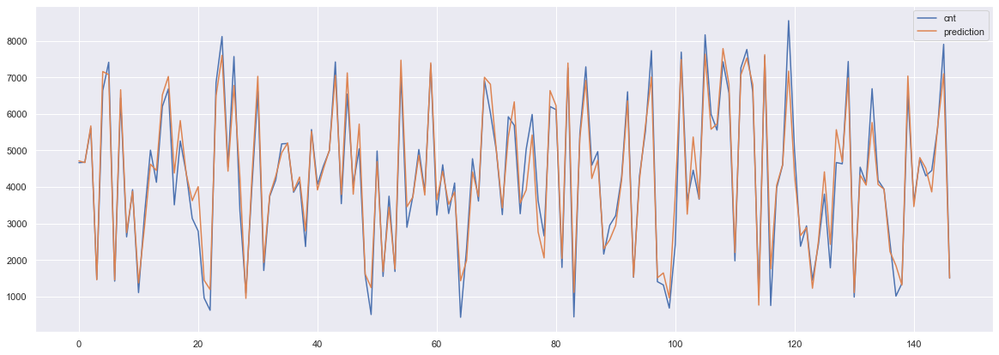

In [42]:
compare.plot(figsize=(20,7))

In [43]:
# 'cnt' present the original count of bike rental and 'prediction' showed our model has predicted the bike rental count. 
# It is quite amazing that our model's prediction capacity.